In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import networkx as nx
import plotly.graph_objects as go

from itertools import combinations
from collections import defaultdict

import warnings
warnings.filterwarnings("ignore")

In [17]:
airport = pd.read_csv(r'F:\01_Dataset\08 Social Network Dataset\04 OpenFlight\airports.csv',
                     usecols=['Name','City','Country','IATA','Latitude','Longitude'])
route = pd.read_csv(r'F:\01_Dataset\08 Social Network Dataset\04 OpenFlight\routes.csv',
                   usecols=['Source airport','Destination airport'])

In [18]:
def country_count(country_list):    
    country_count = pd.DataFrame(airport[airport['Country'].isin(country_list)]['Country'].value_counts())
    country_count = country_count.head(20)
    city_count = pd.DataFrame(airport[airport['Country'].isin(country_list)]['City'].value_counts())
    city_count = city_count.head(20)
    fig, (ax1,ax2) = plt.subplots(1,2,figsize=(25,6))
    sns.barplot(y=country_count.index,x='Country',data=country_count,ax=ax1)
    sns.barplot(y=city_count.index,x='City',data=city_count,ax=ax2)
    ax1.set_xlabel('No. of Airport by Country')
    ax2.set_xlabel('No. of Airport by City')
    plt.show()

In [19]:
def network_visualize(country_list,title):    
    #Graph Generator
    G = nx.from_pandas_edgelist(route,'Source airport','Destination airport',create_using=nx.DiGraph())

    #country_selection
    airport_df = airport[airport['Country'].isin(country_list)]

    #node & coordinator generation
    coord = {}
    for i in list(G.nodes()):
        X = np.array(airport_df[airport_df['IATA']== i][['Latitude','Longitude']])
        if len(X) == 0:
            G.remove_node(i)
            continue
        else:
            coord[i] = X[0]

    #Node Coordinate Setting
    nx.set_node_attributes(G,coord,'coordinate')

    #Edge & Node Line Generation
    edgex = []
    edgey = []
    for i in G.edges():
        y0, x0 = G.nodes[i[0]]['coordinate']
        y1, x1 = G.nodes[i[1]]['coordinate']
        edgex.append(x0)
        edgex.append(x1) 
        edgex.append(None)
        edgey.append(y0)
        edgey.append(y1) 
        edgey.append(None)

    nodex = []
    nodey = []
    for i in G.nodes():
        y, x = G.nodes[i]['coordinate']
        nodex.append(x)
        nodey.append(y)

    edge_line = go.Scatter(x=edgex,y=edgey,line=dict(width=0.25,color='#888'),mode='lines')
    node_line = go.Scatter(x=nodex, y=nodey,mode='markers',hoverinfo='text',
                            marker=dict(showscale=True,colorscale='YlGnBu',reversescale=True,color=[],size=7.5,
                                        colorbar=dict(thickness=15,title='Node Connections by Color',
                                                      xanchor='left',titleside='right'),line_width=2))

    #Node Adjacent Calculation
    adjacent_numb = []
    node_text = []
    for i in G.adjacency():
        adjacent_numb.append(len(i[1]))
        node_text.append(np.array(airport_df.loc[airport_df['IATA'].isin([i[0]])]["City"])[0]+', '+np.array(airport_df.loc[airport_df['IATA'].isin([i[0]])]["Country"])[0] +' : '+str(len(i[1]))+' Connections')

    node_line.marker.color = adjacent_numb
    node_line.text = node_text

    #network plot

    network = go.Figure(data=[edge_line, node_line],
                 layout=go.Layout(title='<br>Airport Network Graph at ' + title,
                titlefont_size=16,showlegend=False,hovermode='closest',margin=dict(b=10,l=5,r=5,t=10),
                    annotations=[ dict(xref="paper", yref="paper",x=0.005, y=-0.002 ) ]))
    network.show()

In [20]:
def centrality_visualize(country_list,title):   
    
    #Graph Generator
    G = nx.from_pandas_edgelist(route,'Source airport','Destination airport',create_using=nx.DiGraph())

    #country_selection
    airport_df = airport[airport['Country'].isin(country_list)]
    
    airport_n = airport_df.copy()
    airport_n = airport_n.rename(columns={'Name':'Airport'})
    airport_n['Airport'] = airport_n['Airport'].replace({'Airport':'','International':''},regex=True)

    #in_degree calculation
    in_degree = pd.DataFrame(nx.in_degree_centrality(G).items(),columns=['IATA','In Degree'])
    in_degree = in_degree.merge(airport_n,on='IATA')
    in_degree = in_degree.sort_values(by='In Degree',ascending=False).head(10)

    #out_degree calculation
    out_degree = pd.DataFrame(nx.out_degree_centrality(G).items(),columns=['IATA','Out Degree'])
    out_degree = out_degree.merge(airport_n,on='IATA')
    out_degree = out_degree.sort_values(by='Out Degree',ascending=False).head(10)

    #Degree Centrality Calculation
    degree = pd.DataFrame(nx.degree_centrality(G).items(),columns=['IATA','Degree Centrality'])
    degree = degree.merge(airport_n,on='IATA')
    degree = degree.sort_values(by='Degree Centrality',ascending=False).head(10)

    #Betweenness Centrality calculation
    bw_degree = pd.DataFrame(nx.betweenness_centrality(G).items(),columns=['IATA','Betweenness'])
    bw_degree = bw_degree.merge(airport_n,on='IATA')
    bw_degree = bw_degree.sort_values(by='Betweenness',ascending=False).head(10)

    #Closeness calculation
    close_degree = pd.DataFrame(nx.closeness_centrality(G).items(),columns=['IATA','Closeness'])
    close_degree = close_degree.merge(airport_n,on='IATA')
    close_degree = close_degree.sort_values(by='Closeness',ascending=False).head(10)

    #PageRank calculation
    pr_degree = pd.DataFrame(nx.pagerank(G).items(),columns=['IATA','PageRank'])
    pr_degree = pr_degree.merge(airport_n,on='IATA')
    pr_degree = pr_degree.sort_values(by='PageRank',ascending=False).head(10)

    fig, axes = plt.subplots(3,2,figsize=(25,50))
    sns.barplot(y='In Degree',x='Airport',data=in_degree,color='r',ax=axes[0][0])
    sns.barplot(y='Out Degree',x='Airport',data=out_degree,color='yellow',ax=axes[0][1])
    sns.barplot(y='Degree Centrality',x='Airport',data=degree,color='orange',ax=axes[1][0])
    sns.barplot(y='Betweenness',x='Airport',data=bw_degree,color='yellowgreen',ax=axes[1][1])
    sns.barplot(y='Closeness',x='Airport',data=close_degree,color='skyblue',ax=axes[2][0])
    sns.barplot(y='PageRank',x='Airport',data=pr_degree,color='b',ax=axes[2][1])
    axes[0][0].set_title('In Degree of Airport at ' + title)
    axes[0][1].set_title('Out Degree of Airport at ' + title)
    axes[1][0].set_title('Degree Centrality of Airport at ' + title)
    axes[1][1].set_title('Betweenness Centrality of Airport at ' + title)
    axes[2][0].set_title('Closeness Centrality of Airport at ' + title)
    axes[2][1].set_title('PageRank Centrality of Airport at ' + title)
    axes[0][0].tick_params(axis='x', labelrotation=75)
    axes[0][1].tick_params(axis='x', labelrotation=75)
    axes[1][0].tick_params(axis='x', labelrotation=75)
    axes[1][1].tick_params(axis='x', labelrotation=75)
    axes[2][0].tick_params(axis='x', labelrotation=75)
    axes[2][1].tick_params(axis='x', labelrotation=75)
    #airport_n

In [21]:
def new_route_recommendation(country_list):    
    #Graph Generator
    G = nx.from_pandas_edgelist(route,'Source airport','Destination airport',create_using=nx.DiGraph())

    #country_selection
    airport_df = airport[airport['Country'].isin(country_list)]

    #node & coordinator generation
    coord = {}
    for i in list(G.nodes()):
        X = np.array(airport_df[airport_df['IATA']== i][['Latitude','Longitude']])
        if len(X) == 0:
            G.remove_node(i)
            continue
        else:
            coord[i] = X[0]

    # Initialize the defaultdict: recommended
    recommended = defaultdict(int)
    for n, d in G.nodes(data = True):
        for n1, n2 in combinations(G.neighbors(n), 2):
            if not G.has_edge(n1, n2):
                recommended[(n1, n2)] += 1

    airport_rec = airport_df[['Name','IATA','Country']]
    airport_rec['Name'] = airport_rec['Name'].replace({'Airport':'','International':''},regex=True)

    recommend = pd.DataFrame(recommended.items(),columns=['recommend route','count'])
    recommend = recommend.sort_values(by='count',ascending=False)
    recommend['source'] = 'ABC'
    recommend['target'] = 'ABC'

    for i in range(recommend.shape[0]):
        recommend.iloc[i,2] =  recommend.iloc[i,0][0]

    for i in range(recommend.shape[0]):
        recommend.iloc[i,3] =  recommend.iloc[i,0][1]

    recommend = recommend.merge(airport_rec,left_on='source',right_on='IATA')    
    recommend = recommend.drop('IATA',axis=1) 
    recommend = recommend.rename(columns={'Name':'Source Name','Country':'Source Country'})

    recommend = recommend.merge(airport_rec,left_on='target',right_on='IATA')    
    recommend = recommend.drop('IATA',axis=1) 
    recommend = recommend.rename(columns={'Name':'Target Name','Country':'Target Country'})

    recommend = recommend[recommend['Source Country'] != recommend['Target Country']]
    recommend['recommend new route'] = recommend['Source Name'] + ' ' + recommend['Source Country'] + ' ' + recommend['Target Name']+ ' ' + recommend['Target Country']
    recommend = recommend.sort_values(by='count',ascending=False)
    return recommend['recommend new route'].head()

In [22]:
def world_visualize(title):

    airport = pd.read_csv(r'F:\01_Dataset\08 Social Network Dataset\04 OpenFlight\airports.csv',
                     usecols=['Name','City','Country','IATA','Latitude','Longitude'])
    route = pd.read_csv(r'F:\01_Dataset\08 Social Network Dataset\04 OpenFlight\routes.csv',
                   usecols=['Source airport','Destination airport'])
    
    G = nx.from_pandas_edgelist(route.head(30000), 'Source airport', 'Destination airport',create_using=nx.DiGraph())
    
    airport_df = airport.copy()
    available_IATA=list(airport_df["IATA"])
    nodes_in_G=list(G.nodes())
    
    #node & coordinator generation
    coord = {}
    for i in list(G.nodes()):
        X = np.array(airport_df[airport_df['IATA']== i][['Latitude','Longitude']])
        if len(X) == 0:
            G.remove_node(i)
            continue
        else:
            coord[i] = X[0]

    #Node Coordinate Setting
    nx.set_node_attributes(G,coord,'coordinate')

    #Edge & Node Line Generation
    edgex = []
    edgey = []
    for i in G.edges():
        y0, x0 = G.nodes[i[0]]['coordinate']
        y1, x1 = G.nodes[i[1]]['coordinate']
        edgex.append(x0)
        edgex.append(x1) 
        edgex.append(None)
        edgey.append(y0)
        edgey.append(y1) 
        edgey.append(None)

    nodex = []
    nodey = []
    for i in G.nodes():
        y, x = G.nodes[i]['coordinate']
        nodex.append(x)
        nodey.append(y)

    edge_line = go.Scatter(x=edgex,y=edgey,line=dict(width=0.25,color='#888'),mode='lines')
    node_line = go.Scatter(x=nodex, y=nodey,mode='markers',hoverinfo='text',
                            marker=dict(showscale=True,colorscale='YlGnBu',reversescale=True,color=[],size=7.5,
                                        colorbar=dict(thickness=15,title='Node Connections by Color',
                                                      xanchor='left',titleside='right'),line_width=2))

    #Node Adjacent Calculation
    adjacent_numb = []
    node_text = []
    for i in G.adjacency():
        adjacent_numb.append(len(i[1]))
        node_text.append(np.array(airport_df.loc[airport_df['IATA'].isin([i[0]])]["City"])[0]+', '+np.array(airport_df.loc[airport_df['IATA'].isin([i[0]])]["Country"])[0] +' : '+str(len(i[1]))+' Connections')

    node_line.marker.color = adjacent_numb
    node_line.text = node_text

    #network plot

    network = go.Figure(data=[edge_line, node_line],
                 layout=go.Layout(title='<br>Airport Network Graph at ' + title,
                titlefont_size=16,showlegend=False,hovermode='closest',margin=dict(b=10,l=5,r=5,t=10),
                    annotations=[ dict(xref="paper", yref="paper",x=0.005, y=-0.002 ) ]))
    network.show()

### PART I : SOUTH EAST EASIA

In [23]:
country_list = ['Brunei','Thailand','Singapore','Malaysia','Laos','Myanmar','Cambodia','Vietnam','Indonesia','Philippines']

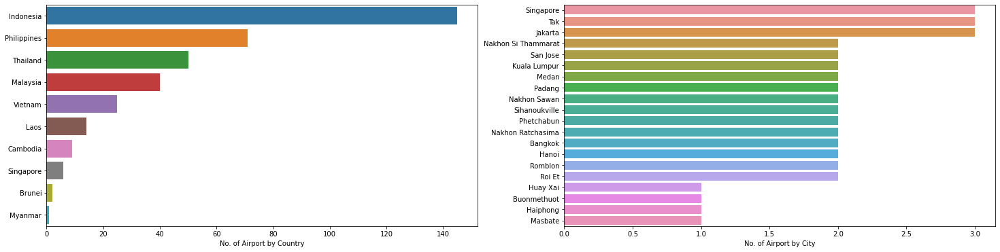

In [24]:
country_count(country_list)

In [25]:
network_visualize(country_list,'South East Asia')

#### CENTRALITY MEASUREMENT : SOUTH EAST ASIA

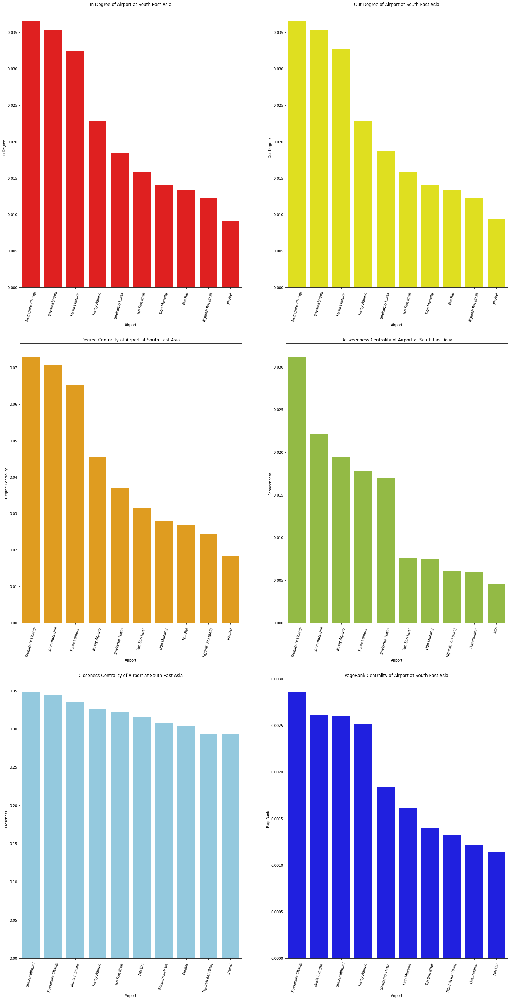

In [26]:
centrality_visualize(country_list,'South East Asia')

#### NEW ROUTE RECOMMENDATION

In [27]:
new_route_recommendation(country_list)

1054       Kuala Lumpur   Malaysia Hang Nadim   Indonesia
1056    Singapore Changi  Singapore Hang Nadim   Indon...
3448     Ninoy Aquino   Philippines Don Mueang   Thailand
4394        Brunei   Brunei Ngurah Rai (Bali)   Indonesia
4071             Phuket   Thailand Tan Son Nhat   Vietnam
Name: recommend new route, dtype: object

### PART II : ASIA PACIFIC

In [28]:
country_list = ['Brunei','Thailand','Singapore','Malaysia','Laos','Myanmar','Cambodia',
                'Vietnam','Indonesia','Philippines','China','Japan','Hongkong','South Korea',
                'Taiwan','Hongkong','Australia','Papua New Guinea','New Zealand']

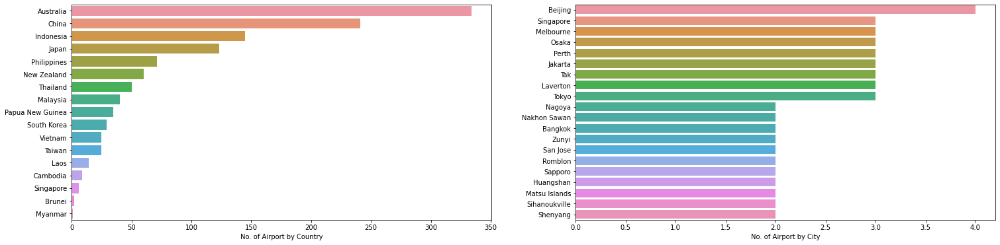

In [29]:
country_count(country_list)

In [30]:
network_visualize(country_list,'Asia Pacific')

#### CENTRALITY MEASUREMENT : ASIA PACIFIC

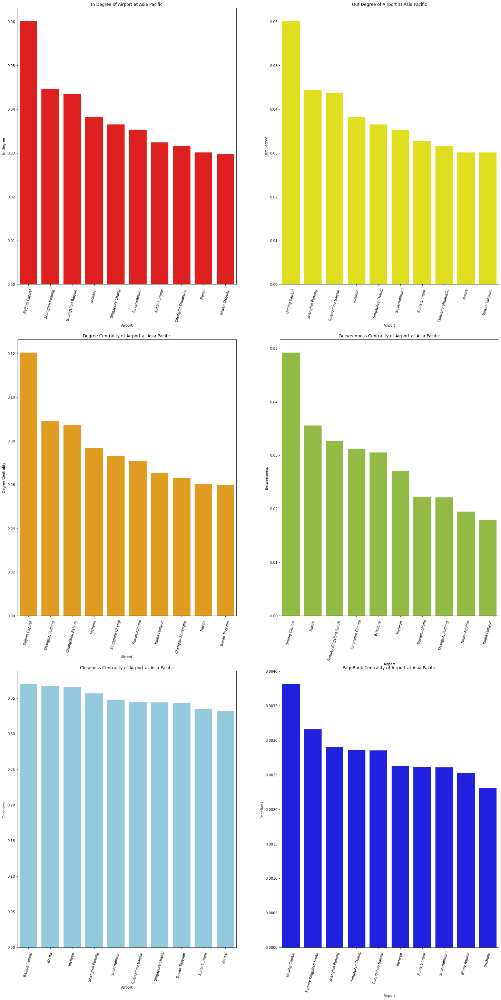

In [31]:
centrality_visualize(country_list,'Asia Pacific')

#### NEW ROUTE RECOMMENDATION

In [32]:
new_route_recommendation(country_list)

38767          Haikou Meilan   China Incheon   South Korea
33893        Taiwan Taoyuan   Taiwan Don Mueang   Thailand
441                      Liuting  China Jeju   South Korea
33878        Beijing Capital   China Don Mueang   Thailand
19337    Taiwan Taoyuan   Taiwan Shanghai Hongqiao   China
Name: recommend new route, dtype: object

### PART III : MIDDLE EAST AND SOUTH ASIA 

In [33]:
country_list = ['India','Nepal','Sri Lanka','Bhutan','Pakistan','Bangladesh','Afghanistan','United Arab Emirates',
                'Iran','Iraq','Qatar','Bahrain'] 

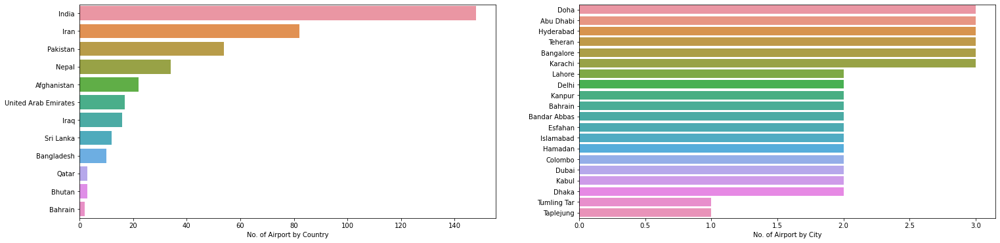

In [34]:
country_count(country_list)

In [35]:
network_visualize(country_list,'Middel East + South Asia')

#### CENTRALITY MEASUREMENT : Middle East + South Asia

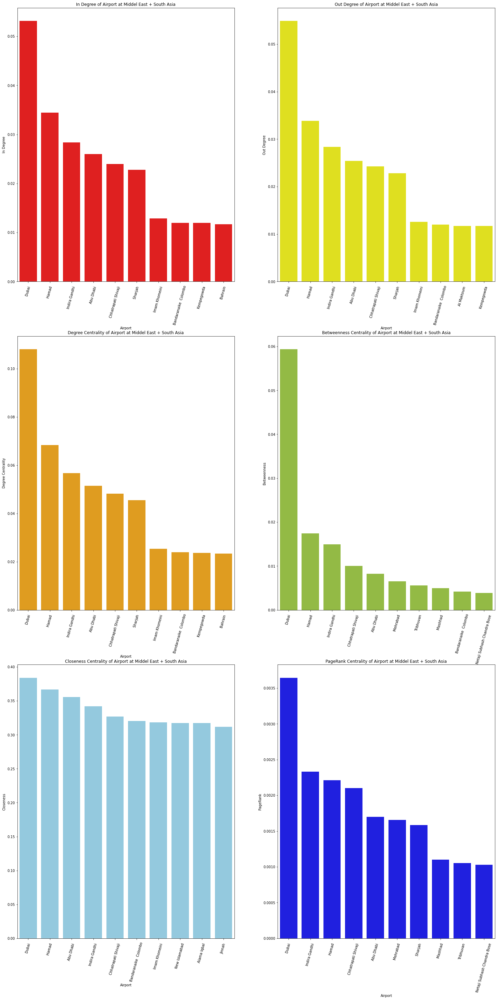

In [36]:
centrality_visualize(country_list,'Middel East + South Asia')

#### NEW ROUTE RECOMMENDATION

In [37]:
new_route_recommendation(country_list)

2       Netaji Subhash Chandra Bose   India Sharjah   ...
87      Netaji Subhash Chandra Bose   India Abu Dhabi ...
3292    Sardar Vallabhbhai Patel   India Bandaranaike ...
4677    Sardar Vallabhbhai Patel   India Tribhuvan   N...
3817       Indira Gandhi   India New Islamabad   Pakistan
Name: recommend new route, dtype: object

### PART IV : EUROPE

In [38]:
country_list = ['United Kingdom','France','Germany','Spain','Italy','Switzerland','Netherlands','Belgium','Austria',
                'Sweden','Denmark','Norway','Poland','Serbia','Croatia','Ireland','Hungary','Russia']

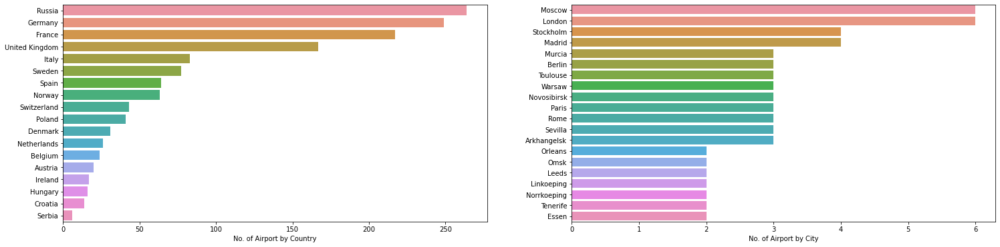

In [39]:
country_count(country_list)

In [40]:
network_visualize(country_list,'Europe')

#### CENTRALITY MEASUREMENT : EUROPE

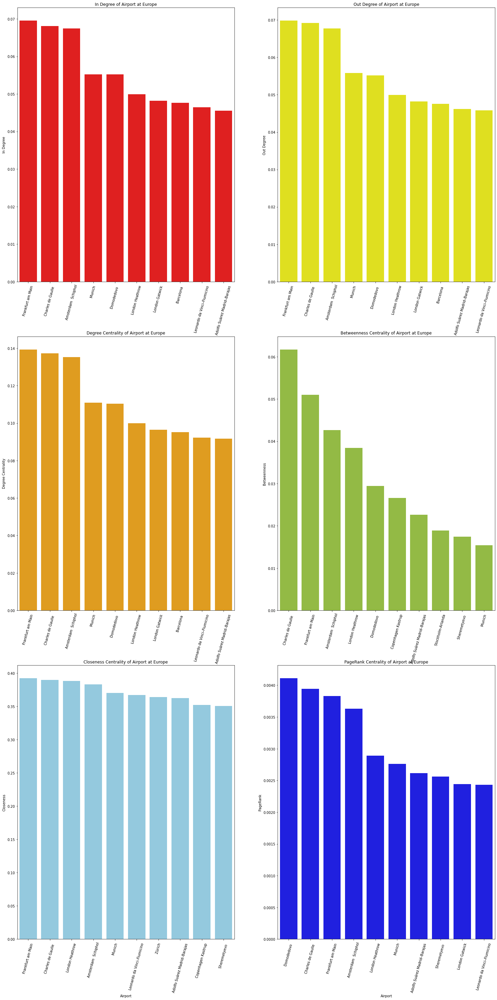

In [41]:
centrality_visualize(country_list,'Europe')

#### NEW ROUTE RECOMMENDATION

In [42]:
new_route_recommendation(country_list)

27038    Brussels South Charleroi  Belgium London Stans...
32214    Berlin-Tegel  Germany London Gatwick  United K...
28883                Düsseldorf  Germany Brussels  Belgium
404                 Málaga  Spain Nice-Côte d'Azur  France
41033     Berlin-Tegel  Germany Manchester  United Kingdom
Name: recommend new route, dtype: object

### PART V : North America

In [43]:
country_list = ['United States','Canada','Mexico','Panama','Costa Rica','Guatemala','Nicaragua','Belize',
                'Honduras','El Salvador']

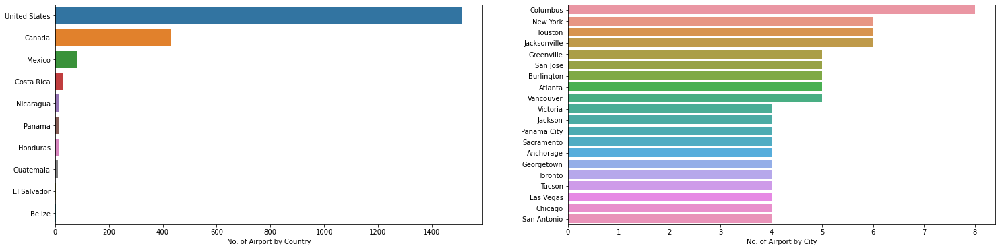

In [44]:
country_count(country_list)

In [45]:
network_visualize(country_list,'North America and Central America')

#### CENTRALITY MEASUREMENT : NORTH AMERICA AND CENTRAL AMERICA

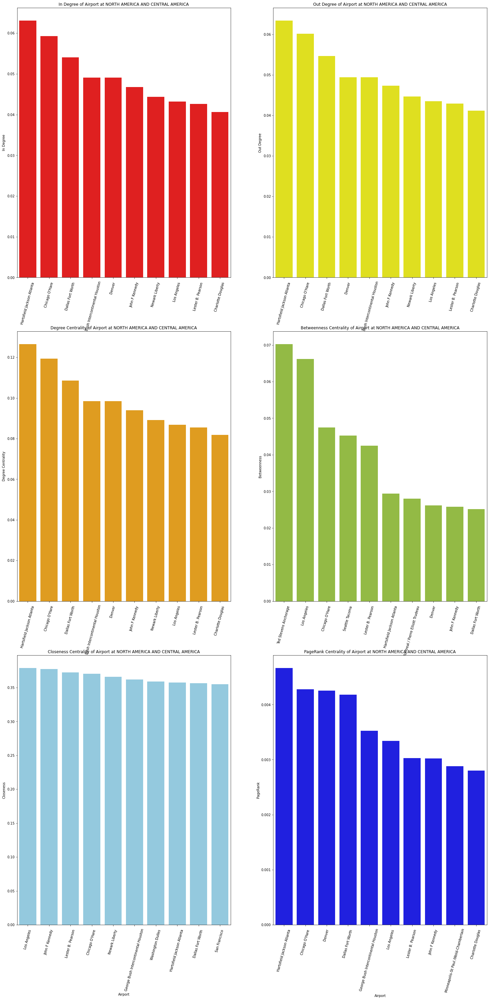

In [46]:
centrality_visualize(country_list,'NORTH AMERICA AND CENTRAL AMERICA')

#### NEW ROUTE RECOMMENDATION

In [47]:
new_route_recommendation(country_list)

57273             Cancún   Mexico McCarran   United States
5        Lester B. Pearson   Canada Chicago Midway   Un...
48268                Cancún   Mexico Tampa   United States
56776    Phoenix Sky Harbor   United States Montreal / ...
58400            Cancún   Mexico San Diego   United States
Name: recommend new route, dtype: object

### PART VI : South America

In [48]:
country_list = ['Brazil','Argentina','Chile','Venezuela','Colombia','Peru','Boliavia','Uruguay','Paraguay','Eguador']

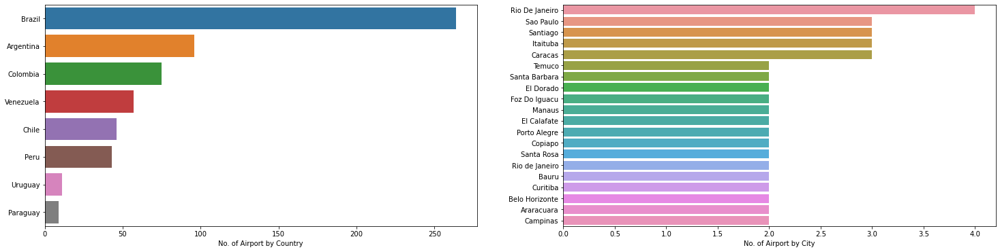

In [49]:
country_count(country_list)

In [50]:
network_visualize(country_list,'North America and Central America')

#### CENTRALITY MEASUREMENT : SOUTH AMERICA

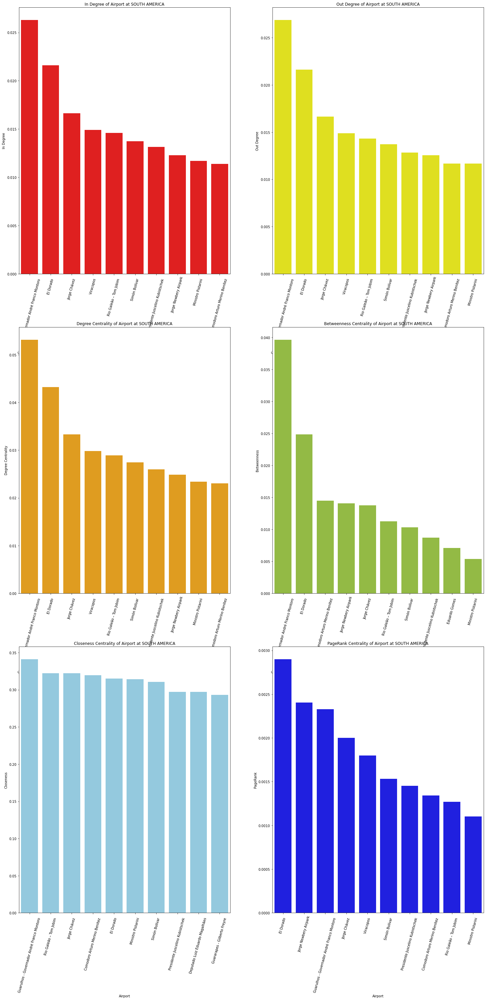

In [51]:
centrality_visualize(country_list,'SOUTH AMERICA')

#### NEW ROUTE RECOMMENDATION

In [52]:
new_route_recommendation(country_list)

262     Jorge Newbery Airpark Argentina Jorge Chávez  ...
4626    Carrasco  /General C L Berisso  Uruguay Hercíl...
139     Viracopos   Brazil Ministro Pistarini   Argentina
2       Jorge Newbery Airpark Argentina Congonhas  Brazil
142     Tancredo Neves   Brazil Ministro Pistarini   A...
Name: recommend new route, dtype: object

### PART V : WORLD

In [53]:
country_list = ['Brunei','Thailand','Singapore','Malaysia','Laos','Myanmar','Cambodia',
                'Vietnam','Indonesia','Philippines','China','Japan','Hongkong','South Korea',
                'Taiwan','Hongkong','Australia','Papua New Guinea','New Zealand','India',
                'Nepal','Sri Lanka','Bhutan','Pakistan','Bangladesh','Afghanistan','United Arab Emirates',
                'Iran','Iraq','Qatar','Bahrain','United Kingdom','France','Germany','Spain','Italy',
                'Switzerland','Netherlands','Belgium','Austria','Sweden','Denmark','Norway','Poland',
                'Serbia','Croatia','Ireland','Hungary','Russia','United States','Canada','Mexico','Panama',
                'Costa Rica','Guatemala','Nicaragua','Belize','Honduras','El Salvador','Brazil','Argentina'
                ,'Chile','Venezuela','Colombia','Peru','Boliavia','Uruguay','Paraguay','Eguador']
               # 'South Africa'] 'Kenya','Libya','Iceland','Tanzania','Nigeria','Egypt','Morocco','Sudan'] #,'Angola','Tunisia']

In [54]:
country_list = airport['Country'].unique()

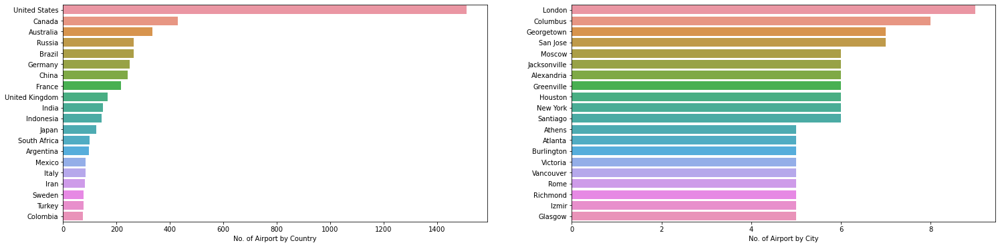

In [55]:
country_count(country_list)

In [56]:
world_visualize('world')

#### CENTRALITY MEASUREMENT : WORLD

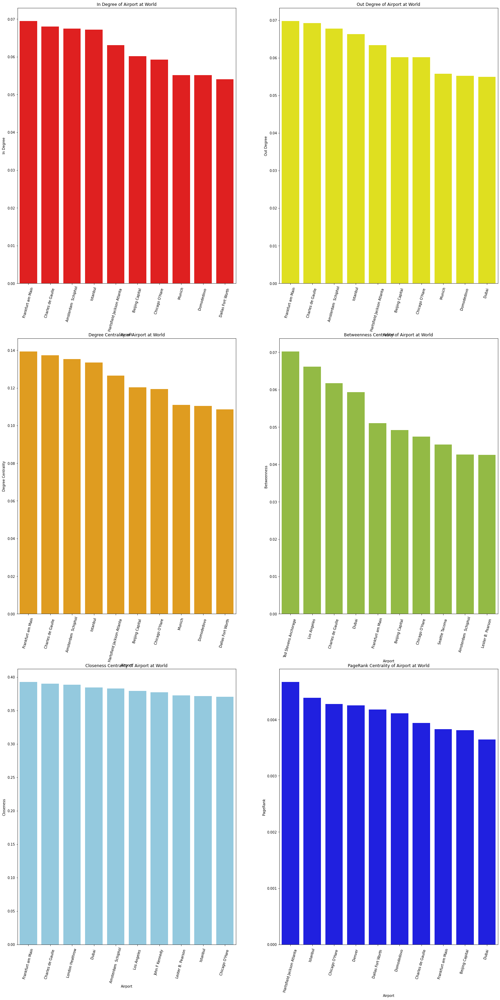

In [57]:
centrality_visualize(country_list,'World')